FINAL CODE

In [68]:
!pip install memory_profiler
!pip install seaborn

import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import memory_profiler
from memory_profiler import memory_usage
import pandas as pd

##########################################################################PROXIMITY OPERATORS################################################

def soft_threshold(x, lambda_val):
    return np.sign(x) * np.maximum(np.abs(x) - lambda_val, 0)

def elastic_net_prox(x, lambda_l1, lambda_l2, L):
    return soft_threshold(x, lambda_l1 / L) / (1 + lambda_l2 / L)

def ridge_prox(x, lambda_l2, L):
    return x / (1 + lambda_l2 / L)

## Function to choose the right proximal operator in each case
def prox_operator(x, regularization_type, lambda_l1, lambda_l2, L):
    if regularization_type == 'l1':
        return soft_threshold(x, lambda_l1 / L)
    elif regularization_type == 'l2':
        return ridge_prox(x, lambda_l2, L)
    elif regularization_type == 'elastic_net':
        return elastic_net_prox(x, lambda_l1, lambda_l2, L)
    else:
        raise ValueError(f"Unknown regularization type: {regularization_type}")

######################################################LINE SEARCH METHODS###########################################################
def determine_reg_type(lambda_l1,lambda_l2):
     if lambda_l1 > 0 and lambda_l2 > 0:
        return 'elastic_net'
     elif lambda_l1 > 0:
        return 'l1'
     elif lambda_l2 > 0:
        return 'l2'

## Objective function

def objective_function(A, b, x, lambda_l1=0.0, lambda_l2=0.0, regularization_type='l1'):
    f_x = 0.5 * np.sum((A @ x - b) ** 2)
    if regularization_type == 'l1':
        g_x = lambda_l1 * np.sum(np.abs(x))
    elif regularization_type == 'l2':
        g_x = 0.5*lambda_l2 * np.sum(x ** 2)
    elif regularization_type == 'elastic_net':
        g_x = lambda_l1 * np.sum(np.abs(x)) + 0.5*lambda_l2 * np.sum(x ** 2)
    else:
        raise ValueError(f"Unknown regularization type: {regularization_type}")
    return f_x + g_x

def backtracking_line_search(A, b, x, grad, lambda_l1, lambda_l2, regularization_type, alpha=0.5, beta=0.8, max_iter=100):
    t = 1.0
    f_x = objective_function(A, b, x, lambda_l1, lambda_l2, regularization_type)
    grad_norm_sq = np.sum(grad ** 2)

    for _ in range(max_iter):
        x_new = prox_operator(x - t * grad, regularization_type, lambda_l1, lambda_l2, 1/t)
        f_x_new = objective_function(A, b, x_new, lambda_l1, lambda_l2, regularization_type)
        if f_x_new <= f_x - alpha * t * grad_norm_sq:
            return t
        t *= beta
    return t

############################################################ALGORITHMS###############################################################
## The way these functions are designed is explained in detail in the project report

def ista(A, b, lambda_l1, lambda_l2=0.0, max_iter=1000, tol=1e-6, return_iterations=False, regularization_type='elastic_net', line_search='fixed'):
    n_samples, n_features = A.shape
    x = np.zeros(n_features)
    if line_search == 'fixed':
      L = np.linalg.norm(A.T @ A, 2) + 2 * lambda_l2
    mse_history = []
    f_x_history=[]
    for k in range(max_iter):
        grad = A.T @ (A @ x - b) + 2 * lambda_l2 * x
        if line_search == 'fixed':
            x_new = prox_operator(x - grad / L, regularization_type, lambda_l1, lambda_l2, L)
        elif line_search == 'backtracking':
            t = backtracking_line_search(A, b, x, grad, lambda_l1, lambda_l2, regularization_type)
            x_new = prox_operator(x - t * grad, regularization_type, lambda_l1, lambda_l2, 1/t)
        else:
            raise ValueError(f"Unknown line search method: {line_search}")
        mse = np.mean((A @ x_new - b) ** 2)
        f_x = objective_function(A, b, x_new, lambda_l1, lambda_l2, regularization_type)
        mse_history.append(mse)
        f_x_history.append(f_x)
        if np.linalg.norm(x_new - x) < tol:
            break
        x = x_new

    if return_iterations:
        return x, k, mse_history, f_x_history
    return x

def fista(A, b, lambda_l1, lambda_l2=0.0, max_iter=1000, tol=1e-6, return_iterations=False, regularization_type='elastic_net', line_search='fixed'):
    n_samples, n_features = A.shape
    x = np.zeros(n_features)
    y = x.copy()
    t = 1
    if line_search == 'fixed':
     L = np.linalg.norm(A.T @ A, 2) + 2 * lambda_l2
    mse_history = []
    f_x_history=[]
    for k in range(max_iter):
        grad = A.T @ (A @ y - b) + 2 * lambda_l2 * y

        if line_search == 'fixed':
            x_new = prox_operator(y - grad / L, regularization_type, lambda_l1, lambda_l2, L)
        elif line_search == 'backtracking':
            t_step = backtracking_line_search(A, b, y, grad, lambda_l1, lambda_l2, regularization_type)
            x_new = prox_operator(y - t_step * grad, regularization_type, lambda_l1, lambda_l2, 1/t_step)
        else:
            raise ValueError(f"Unknown line search method: {line_search}")

        t_new = (1 + np.sqrt(1 + 4 * t**2)) / 2
        y = x_new + ((t - 1) / t_new) * (x_new - x)

        mse = np.mean((A @ x_new - b) ** 2)
        mse_history.append(mse)
        f_x = objective_function(A, b, x_new, lambda_l1, lambda_l2, regularization_type)
        f_x_history.append(f_x)
        if np.linalg.norm(x_new - x) < tol:
            break

        x, t = x_new, t_new

    if return_iterations:
        return x, k, mse_history, f_x_history
    return x


def gradient_descent(A, b, lambda_l2=0.0, max_iter=1000, tol=1e-6, return_iterations=True, line_search='fixed'):
    n_features = A.shape[1]
    x = np.zeros(n_features)
    mse_history = []
    f_x_history=[]
    if line_search == 'fixed':
        L = np.linalg.norm(A.T @ A, 2) + 2 * lambda_l2
        lr = 1 / L

    for k in range(int(max_iter)):
        grad = A.T @ (A @ x - b) + 2 * lambda_l2 * x

        if line_search == 'fixed':
            x_new = x - lr * grad
        elif line_search == 'backtracking':
            t = backtracking_line_search(A, b, x, grad, 0.0, lambda_l2, 'l2')
            x_new = x - t * grad
        else:
            raise ValueError(f"Unknown line search method: {line_search}")

        mse = np.mean((A @ x_new - b) ** 2)
        mse_history.append(mse)
        f_x = objective_function(A, b, x_new,lambda_l2,0, regularization_type=determine_reg_type(0,lambda_l2))
        f_x_history.append(f_x)
        if np.linalg.norm(x_new - x) < tol:
            break
        x = x_new

    if return_iterations:
        return x, k, mse_history, f_x_history
    return x

def dual_fista(A, b, lambda_l1, lambda_l2=0, max_iter=1000, tol=1e-6, return_iterations=False):
    """
    Dual-FISTA solver for LASSO problems (ℓ₁ only).

    Solves:
        min_x 0.5 * ||Ax - b||^2 + lambda_l1 * ||x||_1

    by solving its dual:
        max_alpha -0.5 * ||alpha||^2 - b^T alpha
        subject to ||A^T alpha||_∞ ≤ lambda_l1

    Parameters:
        A : ndarray, shape (n_samples, n_features)
        b : ndarray, shape (n_samples,)
        lambda_l1 : regularization parameter (ℓ₁)
        max_iter : maximum number of iterations
        tol : convergence tolerance
        return_iterations : if True, returns diagnostics

    Returns:
        x : primal solution
        (optionally: k, mse_history, f_x_history)
    """
    n_samples, _ = A.shape
    alpha = np.zeros(n_samples)
    y = alpha.copy()
    t = 1.0
    L = np.linalg.norm(A @ A.T, 2)
    mse_history = []
    f_x_history = []

    for k in range(max_iter):
        grad = A @ (A.T @ y) - b
        alpha_new = y - grad / L

        # Project onto dual feasible set: ||Aᵗ alpha||_∞ ≤ lambda₁
        AT_alpha = A.T @ alpha_new
        scaling = max(1.0, np.max(np.abs(AT_alpha)) / lambda_l1)
        alpha_new /= scaling

        # FISTA update
        t_new = (1 + np.sqrt(1 + 4 * t**2)) / 2
        y = alpha_new + ((t - 1) / t_new) * (alpha_new - alpha)
        alpha = alpha_new
        t = t_new

        # Primal estimate
        x_est = A.T @ alpha
        mse = np.mean((A @ x_est - b) ** 2)
        mse_history.append(mse)

        # Objective
        f_x = 0.5 * np.linalg.norm(A @ x_est - b) ** 2 + lambda_l1 * np.linalg.norm(x_est, 1)
        f_x_history.append(f_x)

        if np.linalg.norm(grad) < tol:
            break

    if return_iterations:
        return x_est, k, mse_history, f_x_history
    return x_est


This benchmarking functions enables us to solve the regression problem for each algortihm, for a wide range of parameters lambda_l1, lambda_l2, max iter, tolerance ....

We then get as an outpout a dataframe containing the average of the n_runs from each algorithm of most of the essential performace measures. It also gives us the value of the MSE and the objective function at each step during each run.

It can be run on synthetic datasets to observe if the expected behavior is followed or on real datasets to make sure the theoritical promises are fufilled.

In [ ]:
######################################################## BENCHMARKING ##############################################################

def run_benchmark(algorithms, data_configs, lambda_range_l1, lambda_range_l2=None, max_iter=1000, tol=1e-3,
                  return_iterations=True, line_search='fixed', n_runs=1,
                  real_datasets=None, target_cols=None):
    if lambda_range_l2 is None:
        lambda_range_l2 = [0.0]
    results = []
    records = []
    # Takes the real dataset and extracts the target column, the splits the samples into training and testing to
    # Make sure our algorithm finds a suitable solution
    if real_datasets:
        if target_cols is None:
            raise ValueError("target_cols must be specified when using real_datasets.")
        dataset_iter = []
        for name, df in real_datasets.items():
            if name not in target_cols:
                raise ValueError(f"Missing target column for dataset '{name}' in target_cols.")
            target_col = target_cols[name]
            A = df.drop(columns=[target_col]).values
            b = df[target_col].values
            from sklearn.model_selection import train_test_split
            A_train, A_test, b_train, b_test = train_test_split(A, b, test_size=0.2, random_state=42)
            dataset_iter.append((name, A_train, b_train, A_test, b_test, None))
    else:
        dataset_iter = []
        for i, config in enumerate(data_configs):
            A, b, x_true = generate_data(**config)
            dataset_iter.append((f"synthetic_{i}", A, b, None, None, x_true))

    for dataset in dataset_iter:
        dataset_name, A, b, A_test, b_test, x_true = dataset

        for lambda_l1 in lambda_range_l1:
            for lambda_l2 in lambda_range_l2:
                reg_type = 'elastic_net' if lambda_l1 > 0 and lambda_l2 > 0 else 'l1' if lambda_l1 > 0 else 'l2'
                for algo_name in algorithms:
                    algo_func = globals()[algo_name]
                    exec_times = []
                    iterations = []
                    memories = []
                    solutions = []
                    last_mse_hist = []

                    for _ in range(n_runs):
                        start_time = time.time()

                        if algo_name in ['ista', 'fista']:
                            mem_usage = memory_usage((algo_func, (A, b, lambda_l1), {
                                'lambda_l2': lambda_l2,
                                'max_iter': max_iter,
                                'tol': tol,
                                'return_iterations': return_iterations,
                                'regularization_type': reg_type,
                                'line_search': line_search
                            }), interval=0.1, timeout=1)
                            x, iters, mse_hist ,f_x_hist = algo_func(A, b, lambda_l1, lambda_l2, max_iter, tol,
                                                          return_iterations, reg_type, line_search)
                        elif algo_name == 'dual_fista':
                            mem_usage = memory_usage((algo_func, (A, b, lambda_l1), {
                                'lambda_l2': lambda_l2,
                                'max_iter': max_iter,
                                'tol': tol,
                                'return_iterations': return_iterations
                            }), interval=0.1, timeout=1)
                            x, iters, mse_hist, f_x_hist = algo_func(A, b, lambda_l1, lambda_l2, max_iter, tol,
                                                          return_iterations)
                        elif algo_name == 'gradient_descent':
                            mem_usage = memory_usage((algo_func, (A, b), {
                                'lambda_l2': lambda_l2,
                                'max_iter': max_iter,
                                'tol': tol,
                                'return_iterations': return_iterations,
                                'line_search': line_search
                            }), interval=0.1, timeout=1)
                            x, iters, mse_hist, f_x_hist = algo_func(A, b, lambda_l2=lambda_l2, max_iter=max_iter,
                                                          tol=tol, return_iterations=return_iterations,
                                                          line_search=line_search)
                        else:
                            mem_usage = memory_usage((algo_func, (A, b, lambda_l1, lambda_l2), {
                                'return_iterations': return_iterations
                            }), interval=0.1, timeout=1)
                            x, iters = algo_func(A, b, lambda_l1, lambda_l2, return_iterations)
                            mse_hist = []

                        end_time = time.time()
                        exec_times.append(end_time - start_time)
                        iterations.append(iters)
                        memories.append(max(mem_usage))
                        solutions.append(x)
                        last_mse_hist = mse_hist
                        last_fx_hist= f_x_hist

                    avg_solution = np.mean(solutions, axis=0)
                    mse_train = np.mean((A @ avg_solution - b) ** 2)
                    mse_test = np.mean((A_test @ avg_solution - b_test) ** 2) if A_test is not None else np.nan
                    sparsity = np.mean(np.abs(avg_solution) < tol)
                    error_to_true = np.nan
                    if real_datasets is None:
                        error_to_true = np.linalg.norm(avg_solution - x_true)

                    results.append({
                        'dataset': dataset_name,
                        'algorithm': algo_name,
                        'lambda_l1': lambda_l1,
                        'lambda_l2': lambda_l2,
                        'n_samples': A.shape[0],
                        'n_features': A.shape[1],
                        'sparsity': sparsity,
                        'avg_time': np.mean(exec_times),
                        'std_time': np.std(exec_times),
                        'min_time': np.min(exec_times),
                        'max_time': np.max(exec_times),
                        'max_iterations': np.nanmax(iterations),
                        'min_iterations': np.nanmin(iterations),
                        'avg_iterations': np.nanmean(iterations),
                        'std_iterations': np.nanstd(iterations),
                        'avg_memory': np.mean(memories),
                        'mse_train': mse_train,
                        'mse_test': mse_test,
                        'solution_sparsity': sparsity,
                        'error_to_true': error_to_true
                    })

                    if last_mse_hist:
                        records.append({ 'algorithm': algo_name,
                                              'dataset': dataset_name,
                                             'lambda_l1': lambda_l1,
                                             'lambda_l2': lambda_l2,
                                             'mse_history': last_mse_hist,
                                             'f_x_history': last_fx_hist
                                      })

    return pd.DataFrame(results), records

We used google colab for the project so the datatsets were stored in the Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Here we import the 2 datasets and define the target columns.

These datasets have already been preprocessed for the most part. Except the value of of the Sale prices for the House prices dataset were we applied a log function to make their values more manageable.

In [ ]:
real_datasets = {
    "house_prices": pd.read_csv("/content/drive/MyDrive/house_prices_preprocessed.csv"),
    "Student_grades" : pd.read_csv("/content/drive/MyDrive/students_normalized2.csv")
}
target_cols = {
    "house_prices": "SalePrice",
    "Student_grades" : "math score"
}
real_datasets["house_prices"]["SalePrice"] = np.log1p(real_datasets["house_prices"]["SalePrice"])

Glimpse of the different datsets; the design matrix of each dataset is very different in number of features (288 vs 14). And the values of said features are also very different with the Student Grades matrix being quite sparse.

In [ ]:
real_datasets["house_prices"].head(5)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,12.247699
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,12.109016
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,12.317171
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,11.849405
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,12.429220


In [ ]:
real_datasets["Student_grades"].head(5)

,reading score,writing score,gender_male,race/ethnicity_group B,race/ethnicity_group C,race/ethnicity_group D,race/ethnicity_group E,parental level of education_bachelor's degree,parental level of education_high school,parental level of education_master's degree,parental level of education_some college,parental level of education_some high school,lunch_standard,test preparation course_none,math score
0,0.662651,0.711111,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.72
1,0.879518,0.866667,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.69
2,0.939759,0.922222,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.90
3,0.481928,0.377778,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.47
4,0.734940,0.722222,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.76


In [ ]:
def get_best_hyperparams(results_df, metric="mse_test"):
    """
    Extract the best (lambda_l1, lambda_l2) combination for each algorithm and dataset
    based on the lowest mse_test (or another metric).

    Parameters:
    - results_df: DataFrame returned by run_benchmark
    - metric: the metric to minimize (default: mse_test)

    Returns:
    - DataFrame with one row per (algorithm, dataset) with the best hyperparameters
    """
    # Filter out NaNs just in case
    filtered_df = results_df.dropna(subset=[metric])

    # Group by algorithm and dataset, select the row with minimal metric value
    best_params = (
        filtered_df.loc[filtered_df.groupby(["algorithm", "dataset"])[metric].idxmin()]
        .reset_index(drop=True)
        .sort_values(by=["dataset", "algorithm"])
    )

    return best_params


  This is the grid in which we will be looking for the best pair of lamabda_l1 and lambda_l2 for each algorithm.


  This is essential to give a fair shot to each algorithm on each dataset, if we do not complete this step and compared the algorithms for the same parameters then we would just see which algorithm is best for each set of parameters and not the one who is truly superior in a real life application.

In [ ]:
range_l1= [10e-5, 10e-4, 10e-3, 10e-2, 10e-1, 1]
range_l2= [10e-5, 10e-4, 10e-3, 10e-2, 10e-1, 1]

In [70]:
results_ista, records_ista = run_benchmark(
    algorithms=['ista'],
    data_configs=[],  # real dataset so empty
    lambda_range_l1=range_l1,
    lambda_range_l2=range_l2,
    real_datasets=real_datasets,
    target_cols=target_cols,
    max_iter=2000,
    tol=1e-5,
    return_iterations=True,
    line_search='fixed',
    n_runs=3
)
best_params_ista = get_best_hyperparams(results_ista)
print(best_params_ista)

          dataset algorithm  lambda_l1  lambda_l2  n_samples  n_features  \
0  Student_grades      ista     1.0000     0.0001        800          14   
1    house_prices      ista     0.0001     0.0001       1168         287   

   sparsity  avg_time  std_time  min_time  max_time  max_iterations  \
0  0.285714  0.579777  0.008500  0.569536  0.590349            1999   
1  0.006969  3.372749  0.617602  2.854688  4.240761            1999   

   min_iterations  avg_iterations  std_iterations  avg_memory  mse_train  \
0            1999          1999.0             0.0  504.473958   0.002905   
1            1999          1999.0             0.0  502.075521   0.022201   

   mse_test  solution_sparsity  error_to_true  
0  0.002827           0.285714            NaN  
1  0.029426           0.006969            NaN  


In [60]:
results_fista, records_fista = run_benchmark(
    algorithms=['fista'],
    data_configs=[],  # real datasets so empty
    lambda_range_l1=range_l1,
    lambda_range_l2=range_l2,
    real_datasets=real_datasets,
    target_cols=target_cols,
    max_iter=2000,
    tol=1e-5,
    return_iterations=True,
    line_search='fixed',
    n_runs=3
)
best_params_fista = get_best_hyperparams(results_fista)
print(best_params_fista)

          dataset algorithm  lambda_l1  lambda_l2  n_samples  n_features  \
0  Student_grades     fista        1.0     0.1000        800          14   
1    house_prices     fista        0.1     0.0001       1168         287   

   sparsity  avg_time  std_time  min_time  max_time  max_iterations  \
0  0.285714  0.200091  0.033925  0.173250  0.247951             192   
1  0.114983  2.334482  0.122830  2.240531  2.507991            1999   

   min_iterations  avg_iterations  std_iterations  avg_memory  mse_train  \
0             192           192.0             0.0  485.492188   0.002892   
1            1999          1999.0             0.0  485.503906   0.008851   

   mse_test  solution_sparsity  error_to_true  
0  0.002837           0.285714            NaN  
1  0.014760           0.114983            NaN  


In [76]:
results_GD, records__GD = run_benchmark(
    algorithms=['gradient_descent'],
    data_configs=[],  # real datasets so empty
    lambda_range_l1=[0],
    lambda_range_l2=range_l2,
    real_datasets=real_datasets,
    target_cols=target_cols,
    max_iter=2000,
    tol=1e-5,
    return_iterations=True,
    line_search='fixed',
    n_runs=3
)
best_params_GD = get_best_hyperparams(results_GD)
print(best_params_GD)

          dataset         algorithm  lambda_l1  lambda_l2  n_samples  \
0  Student_grades  gradient_descent          0     0.1000        800   
1    house_prices  gradient_descent          0     0.0001       1168   

   n_features  sparsity  avg_time  std_time  min_time  max_time  \
0          14  0.000000  0.555300  0.042810  0.507859  0.611594   
1         287  0.006969  2.282037  0.083515  2.188263  2.391109   

   max_iterations  min_iterations  avg_iterations  std_iterations  avg_memory  \
0            1999            1999          1999.0             0.0  512.697917   
1            1999            1999          1999.0             0.0  511.453125   

   mse_train  mse_test  solution_sparsity  error_to_true  
0   0.002859  0.002866           0.000000            NaN  
1   0.022200  0.029426           0.006969            NaN  


In [52]:
results_dual, records_dual = run_benchmark(
    algorithms=['dual_fista'],
    data_configs=[],  # real datasets so empty
    lambda_range_l1=range_l1,
    lambda_range_l2=[0],
    real_datasets=real_datasets,
    target_cols=target_cols,
    max_iter=2000,
    tol=1e-5,
    return_iterations=True,
    line_search='fixed',
    n_runs=3
)
best_params_dual = get_best_hyperparams(results_dual)
print(best_params_dual)

          dataset   algorithm  lambda_l1  lambda_l2  n_samples  n_features  \
0  Student_grades  dual_fista        1.0          0        800          14   
1    house_prices  dual_fista        1.0          0       1168         287   

   sparsity  avg_time  std_time  min_time  max_time  max_iterations  \
0  0.000000  0.970725  0.010978  0.955791  0.981865            1999   
1  0.006969  5.830446  1.174999  4.436347  7.310629            1999   

   min_iterations  avg_iterations  std_iterations  avg_memory  mse_train  \
0            1999          1999.0             0.0  485.359375   0.002834   
1            1999          1999.0             0.0  485.367188   0.009526   

   mse_test  solution_sparsity  error_to_true  
0  0.002907           0.000000            NaN  
1  0.015902           0.006969            NaN  


Combining the best parameters and the value of the performance indicators for each algorithm

In [66]:
def merge_best_param_tables(*tables):
    """
    Concatenate multiple best_param DataFrames into a single combined DataFrame.

    Parameters:
    - *tables: any number of DataFrames to merge

    Returns:
    - A single concatenated DataFrame
    """
    merged_df = pd.concat(tables, axis=0, ignore_index=True)
    return merged_df

combined_best = merge_best_param_tables(best_params_ista, best_params_fista, best_params_dual, best_params_GD)
print(combined_best)


          dataset         algorithm  lambda_l1  lambda_l2  n_samples  \
0  Student_grades              ista     1.0000     0.0001        800   
1    house_prices              ista     0.0001     0.0001       1168   
2  Student_grades             fista     1.0000     0.1000        800   
3    house_prices             fista     0.1000     0.0001       1168   
4  Student_grades        dual_fista     1.0000     0.0000        800   
5    house_prices        dual_fista     1.0000     0.0000       1168   
6  Student_grades  gradient_descent     0.0000     0.1000        800   
7    house_prices  gradient_descent     0.0000     0.0100       1168   

   n_features  sparsity   avg_time  std_time   min_time   max_time  \
0          14  0.285714   0.663821  0.232964   0.426043   0.980206   
1         287  0.006969   2.706852  0.450518   2.334879   3.340807   
2          14  0.285714   0.200091  0.033925   0.173250   0.247951   
3         287  0.114983   2.334482  0.122830   2.240531   2.507991   
4

Combining the different records to be able to plot them afterwards

In [67]:
def flatten_record_lists(*record_lists):
    """
    Flatten multiple lists of benchmark records into a single list.

    Parameters:
    - *record_lists: one or more lists of benchmark records (dicts)

    Returns:
    - A single flat list combining all records
    """
    flat_records = []
    for record_list in record_lists:
        flat_records.extend(record_list)
    return flat_records
combined_records = flatten_record_lists(records_ista, records_fista, records_dual, records__GD)
print(combined_records)

[{'algorithm': 'ista', 'dataset': 'house_prices', 'lambda_l1': 0.0001, 'lambda_l2': 0.0001, 'mse_history': [np.float64(0.5555385951417919), np.float64(0.5159898506047657), np.float64(0.4856653183740443), np.float64(0.46136904351877517), np.float64(0.4412268676733427), np.float64(0.4240909111160432), np.float64(0.4092235732534326), np.float64(0.3961273018038112), np.float64(0.38445096387756156), np.float64(0.37393690545905744), np.float64(0.36438996215309954), np.float64(0.3556585616775824), np.float64(0.34762267757026755), np.float64(0.3401858021310429), np.float64(0.3332693710749083), np.float64(0.32680875897049827), np.float64(0.3207503157008118), np.float64(0.3150491274563113), np.float64(0.3096672967952733), np.float64(0.3045726050712655), np.float64(0.2997374623854006), np.float64(0.295138076987399), np.float64(0.29075379425071407), np.float64(0.28656656755116355), np.float64(0.28256053256386765), np.float64(0.27872166300410733), np.float64(0.2750374908001303), np.float64(0.271496

Function to plot the MSE of each algorithm as a function of iterations, we use the best hyperparameters for each algorithm of course.


In [55]:
def plot_best_mse(records, best_params_df, dataset_name):
    """
    Plot MSE vs Iteration for all algorithms on the same dataset using their best hyperparameters.

    Parameters:
    - records: list of benchmark record dicts
    - best_params_df: DataFrame containing best parameters for each (algorithm, dataset)
    - dataset_name: name of the dataset to filter
    """
    plt.figure(figsize=(10, 6))
    found_any = False

    for _, row in best_params_df.iterrows():
        if row['dataset'] != dataset_name:
            continue

        algo = row['algorithm']
        l1 = row['lambda_l1']
        l2 = row['lambda_l2']

        for rec in records:
            if (rec['dataset'] == dataset_name and rec['algorithm'] == algo and
                rec['lambda_l1'] == l1 and rec['lambda_l2'] == l2):
                plt.plot(rec['mse_history'], label=f"{algo} (λ₁={l1}, λ₂={l2})")
                found_any = True
                break

    if found_any:
        plt.title(f"MSE vs Iterations for All Algorithms on {dataset_name}")
        plt.xlabel("Iteration")
        plt.ylabel("MSE")
        plt.yscale('log')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No records found for dataset: {dataset_name}")

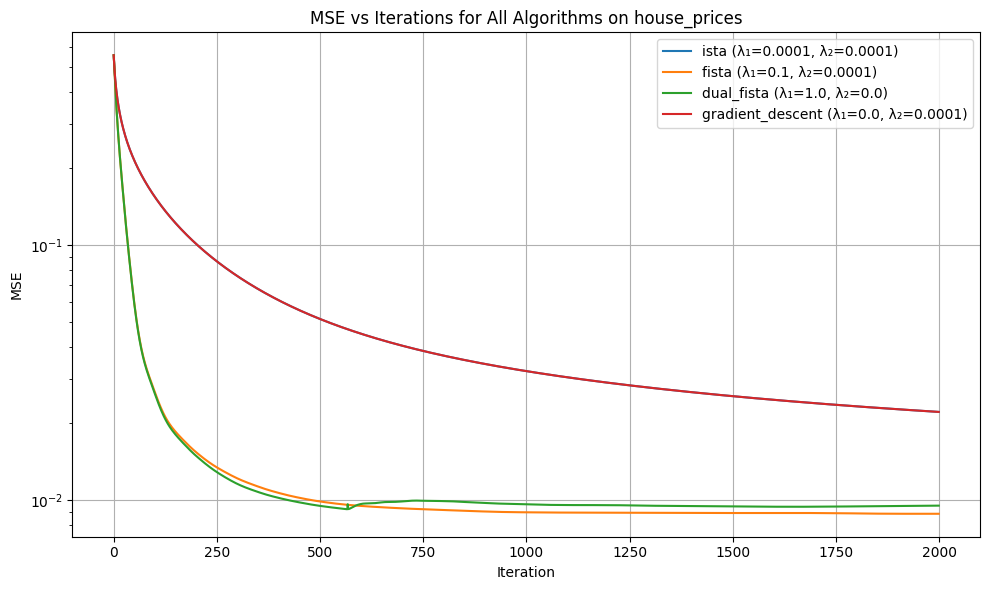

In [56]:
plot_best_mse(combined_records, combined_best, "house_prices")

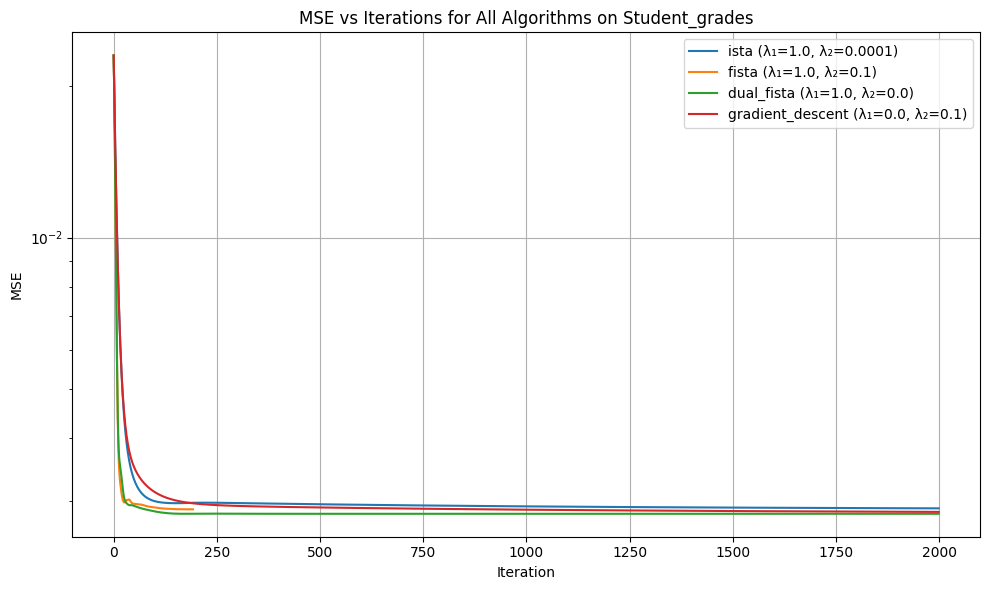

In [57]:
plot_best_mse(combined_records, combined_best, "Student_grades")

Function to plot the evolution of the objective function for each algorithm at the best hyperparameters

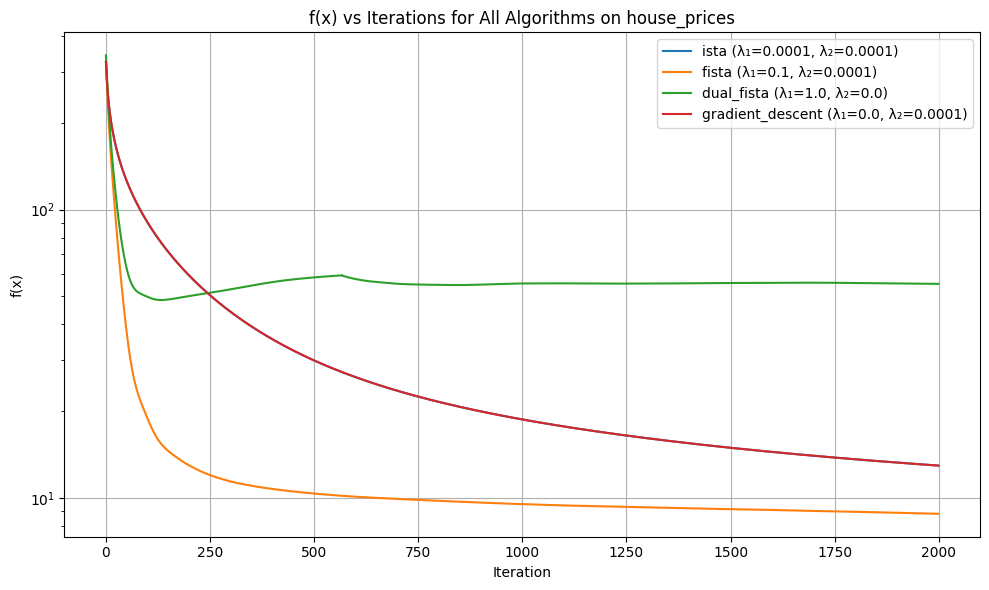

In [47]:
def plot_best_fx(records, best_params_df, dataset_name):
    """
    Plot MSE vs Iteration for all algorithms on the same dataset using their best hyperparameters.

    Parameters:
    - records: list of benchmark record dicts
    - best_params_df: DataFrame containing best parameters for each (algorithm, dataset)
    - dataset_name: name of the dataset to filter
    """
    plt.figure(figsize=(10, 6))
    found_any = False

    for _, row in best_params_df.iterrows():
        if row['dataset'] != dataset_name:
            continue

        algo = row['algorithm']
        l1 = row['lambda_l1']
        l2 = row['lambda_l2']

        for rec in records:
            if (rec['dataset'] == dataset_name and rec['algorithm'] == algo and
                rec['lambda_l1'] == l1 and rec['lambda_l2'] == l2):
                plt.plot(rec['f_x_history'], label=f"{algo} (λ₁={l1}, λ₂={l2})")
                found_any = True
                break

    if found_any:
        plt.title(f"f(x) vs Iterations for All Algorithms on {dataset_name}")
        plt.xlabel("Iteration")
        plt.ylabel("f(x)")
        plt.yscale('log')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No records found for dataset: {dataset_name}")

plot_best_fx(combined_records, combined_best, "house_prices")

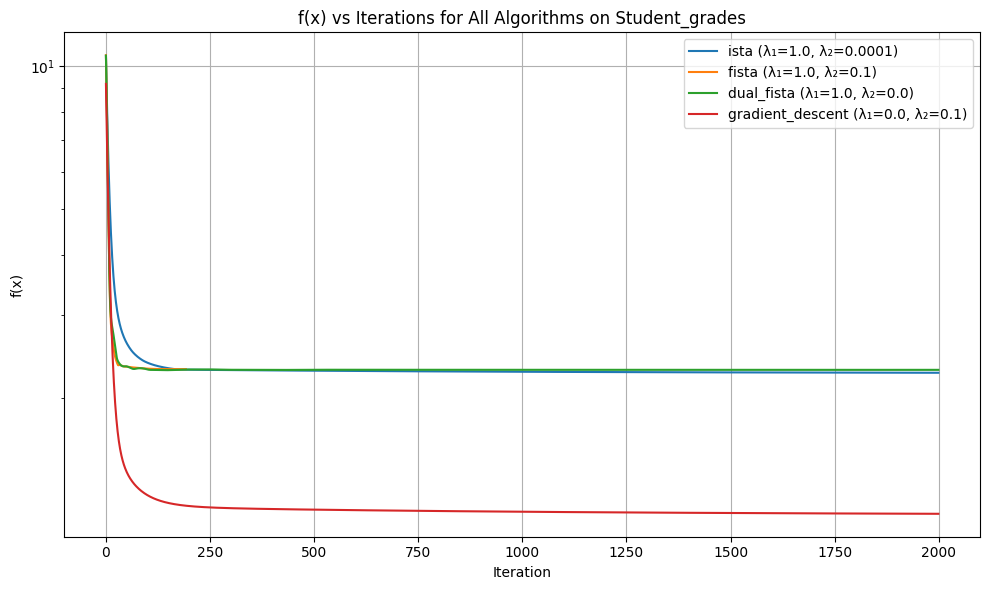

In [48]:
plot_best_fx(combined_records, combined_best, "Student_grades")

Creating representations of the different performance metrics of the best algorithms.

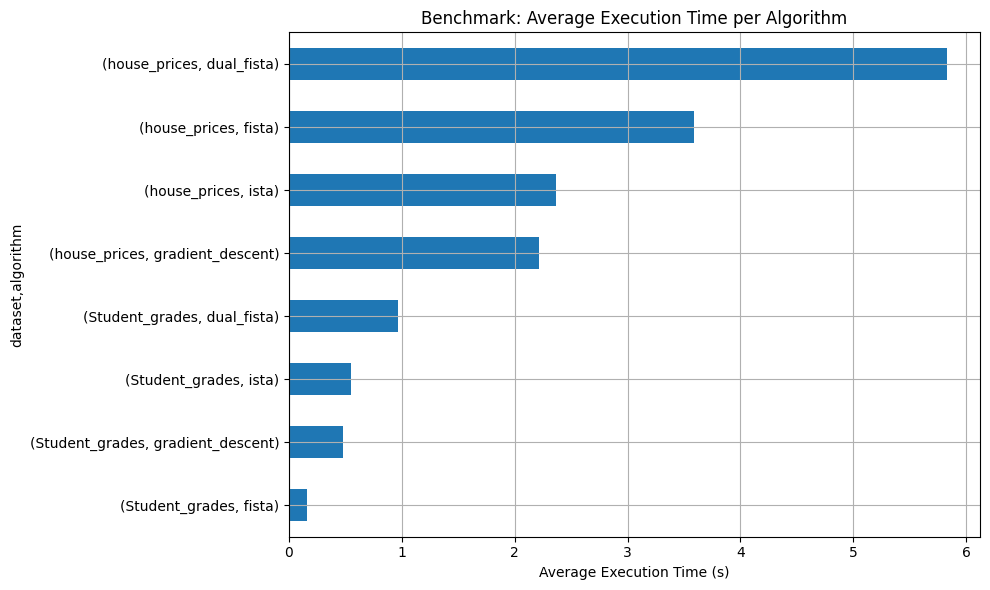

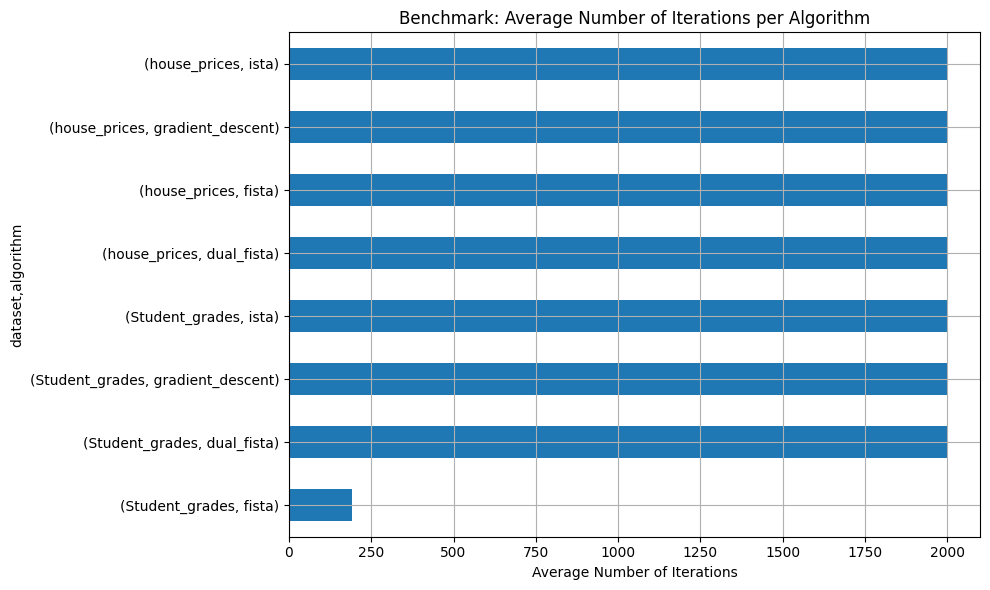

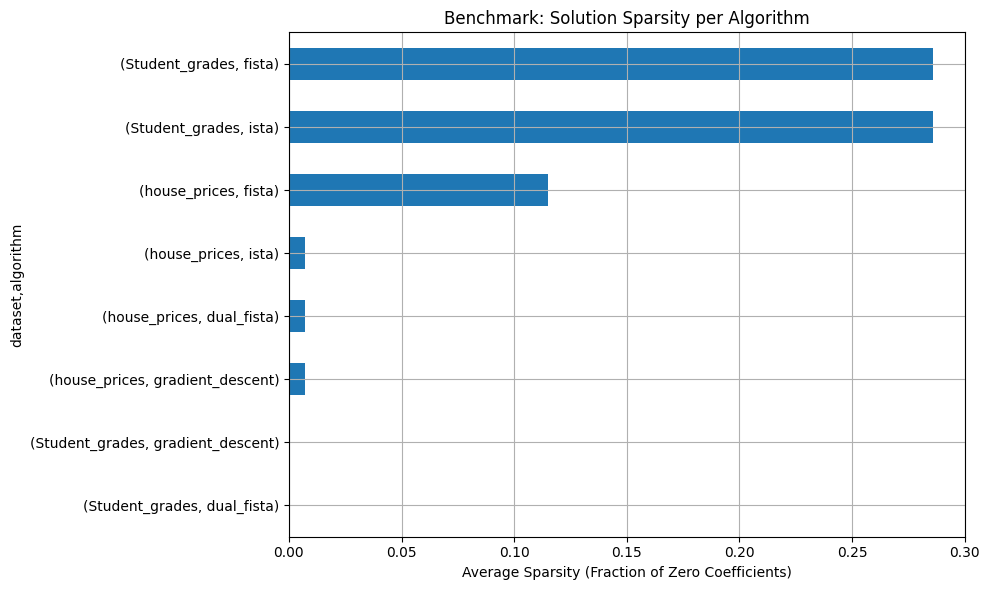

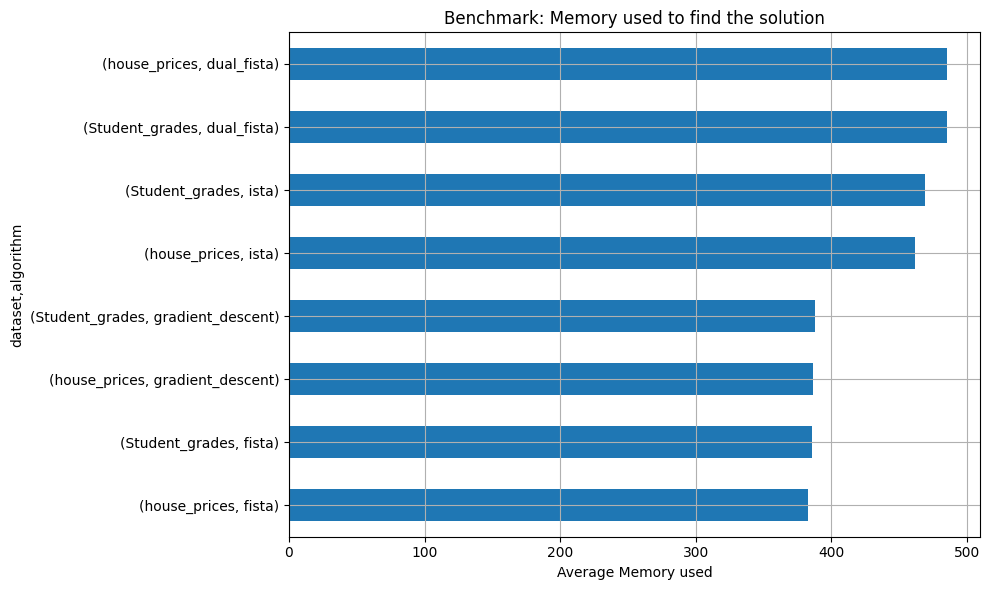

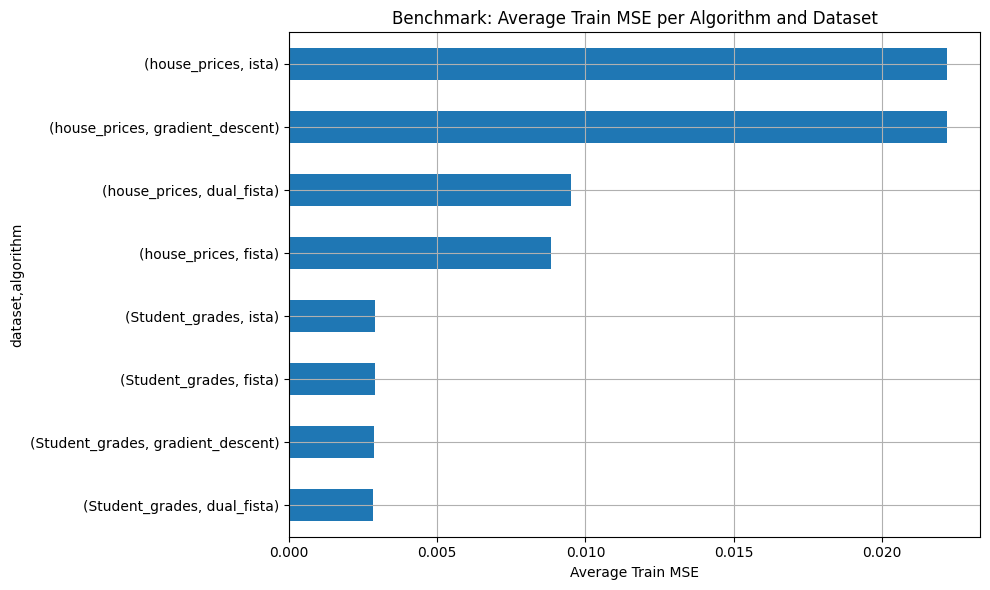

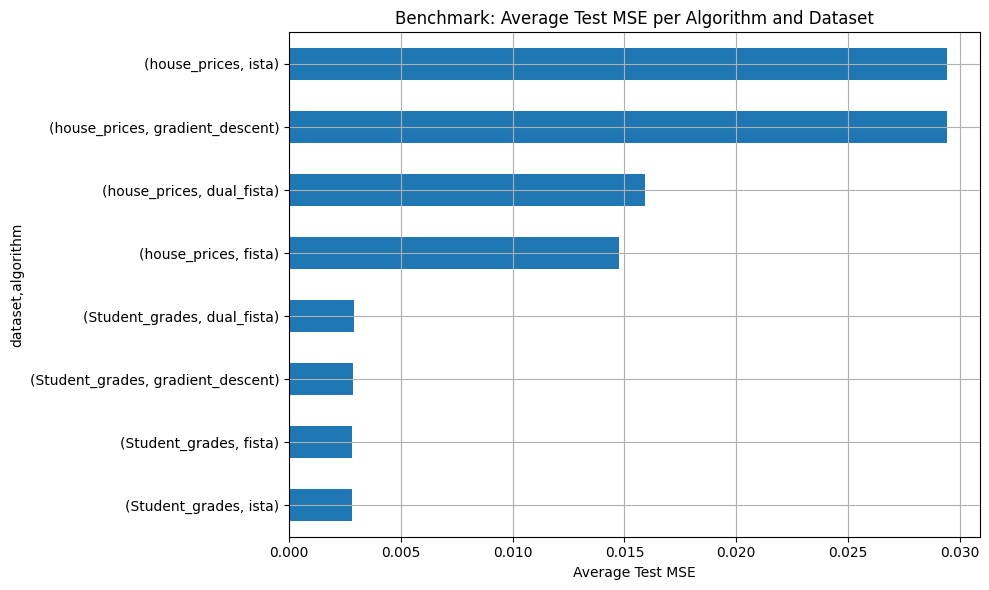

In [58]:
# Group by algorithm and compute mean execution time
avg_times = combined_best.groupby(['dataset','algorithm'])['avg_time'].mean().sort_values()

# Plotting
plt.figure(figsize=(10, 6))
avg_times.plot(kind='barh')
plt.xlabel('Average Execution Time (s)')
plt.title('Benchmark: Average Execution Time per Algorithm')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot: Average Number of Iterations per Algorithm
avg_iterations = combined_best.groupby(['dataset','algorithm'])['avg_iterations'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_iterations.plot(kind='barh')
plt.xlabel('Average Number of Iterations')
plt.title('Benchmark: Average Number of Iterations per Algorithm')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot: Average Sparsity per Algorithm
avg_sparsity = combined_best.groupby(['dataset','algorithm'])['solution_sparsity'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_sparsity.plot(kind='barh')
plt.xlabel('Average Sparsity (Fraction of Zero Coefficients)')
plt.title('Benchmark: Solution Sparsity per Algorithm')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot: Average Memory per Algorithm
avg_sparsity = combined_best.groupby(['dataset','algorithm'])['avg_memory'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_sparsity.plot(kind='barh')
plt.xlabel('Average Memory used')
plt.title('Benchmark: Memory used to find the solution')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot: Average MSE train
avg_mse_train = combined_best.groupby(['dataset', 'algorithm'])['mse_train'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_mse_train.plot(kind='barh')
plt.xlabel('Average Train MSE')
plt.title('Benchmark: Average Train MSE per Algorithm and Dataset')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot: Average MSE test
avg_mse_test = combined_best.groupby(['dataset', 'algorithm'])['mse_test'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_mse_test.plot(kind='barh')
plt.xlabel('Average Test MSE')
plt.title('Benchmark: Average Test MSE per Algorithm and Dataset')
plt.grid(True)
plt.tight_layout()
plt.show()

In [78]:
results_GD_back, records__GD_back = run_benchmark(
    algorithms=['gradient_descent'],
    data_configs=[],  # real datasets so empty
    lambda_range_l1=[0],
    lambda_range_l2=range_l2,
    real_datasets=real_datasets,
    target_cols=target_cols,
    max_iter=2000,
    tol=1e-5,
    return_iterations=True,
    line_search='backtracking',
    n_runs=1
)
best_params_GD_back = get_best_hyperparams(results_GD_back)
print(best_params_GD_back)

          dataset         algorithm  lambda_l1  lambda_l2  n_samples  \
0  Student_grades  gradient_descent          0     0.1000        800   
1    house_prices  gradient_descent          0     0.0001       1168   

   n_features  sparsity   avg_time  std_time   min_time   max_time  \
0          14  0.000000   1.231917       0.0   1.231917   1.231917   
1         287  0.006969  28.975635       0.0  28.975635  28.975635   

   max_iterations  min_iterations  avg_iterations  std_iterations  avg_memory  \
0             593             593           593.0             0.0  517.781250   
1            1999            1999          1999.0             0.0  517.085938   

   mse_train  mse_test  solution_sparsity  error_to_true  
0   0.002858  0.002866           0.000000            NaN  
1   0.010364  0.016707           0.006969            NaN  


Quick test of backtracking on gradient descent, we can see that it makes the computing time explode with a very small improvement of the MSE. We multiply computing time by 30 and get an improvement of about 50% for this reason we will not be using backtracking for gradient descent.